# Import Libraries

In [1]:
###Import important libraries


import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, roc_auc_score


# Load Data

In [2]:
df_train = pd.read_csv('EV_train.csv')
X_test = pd.read_csv('EV_X_test.csv')

#Reads two CSV files into pandas DataFrames:
#EV_train.csv is loaded into df_train, 
#EV_X_test.csv is loaded into X_test


# Separate features and target

In [3]:
# Separate features and target
X = df_train.drop('BuyEV', axis=1)
y = df_train['BuyEV']

#The code separates the features and the target variable from the training dataset:

#X is assigned the features by dropping the BuyEV column from df_train, indicating BuyEV is the target variable.
#y is assigned the target variable by selecting only the BuyEV column from df_train



# Data Preprocessing

In [4]:
# Define categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns.tolist()

###
# Identifies and separates the categorical and numerical columns from the features DataFrame X:

#categorical_cols is a list of column names in X that have data types object or category, representing categorical variables.
#numerical_cols is a list of column names in X that have data types int64 or float64, representing numerical variables.


In [5]:
# Remove columns that need to be encoded differently or engineered
numerical_cols.remove('zipcode')  # Example of a column to be removed for custom processing

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])


#Preprocessing steps for both numerical and categorical data in preparation for machine learning modeling:

#It first removes the zipcode column from the list of numerical columns, suggesting this column requires a different treatment or is not considered a numerical feature for the purpose of model training.
#For numerical data, a Pipeline named numerical_transformer is defined, which standardizes the data using StandardScaler to have a mean of 0 and a standard deviation of 1.
#For categorical data, a OneHotEncoder named categorical_transformer is created to convert categorical variables into a form that could be provided to ML algorithms to do a better job in prediction.
#A ColumnTransformer named preprocessor is then defined, which bundles the preprocessing for numerical and categorical data. It applies the numerical_transformer to the numerical columns and the categorical_transformer to the categorical columns.

# Woring on different Models to compare the accuracy

In [6]:
# Define the model
model = RandomForestClassifier()



In [7]:
# Bundle preprocessing and modeling code in a pipeline
my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('model', model)])




In [8]:
# Split data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0)

# Preprocessing of training data, fit model
my_pipeline.fit(X_train, y_train)


#code creates a pipeline named my_pipeline that bundles together the preprocessing steps and the model training into a single coherent process. The pipeline consists of two main steps:

#'preprocessor' applies the defined preprocessing transformations (preprocessor) to the data, handling both numerical and categorical features as configured previously.
#'model' then fits the RandomForestClassifier (model) to the preprocessed data. This setup streamlines the workflow from raw data to a trained model, ensuring consistency in data processing.


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['PriceBudgetRatio', 'range',
                                                   'HomeSlowChgWalkTime',
                                                   'WorkSlowChgWalkTime',
                                                   'FastChgTime', 'gender',
                                                   'edu', 'employment',
                                                   'hsincome', 'hhsize',
                                                   'housit', 'residence',
                                                   'move', 'all_car', 'new_car',
                                                   'ev', 'new_ev',
                                                   'HomeChgAvai',
        

In [9]:
# Preprocessing of validation data, get predictions
preds = my_pipeline.predict(X_val)

# Evaluate the model
score = accuracy_score(y_val, preds)
print('Accuracy:', score)

#performs predictions on the validation data and evaluates the performance of the model:

#my_pipeline.predict(X_val) uses the trained pipeline to preprocess the validation features (X_val) and make predictions with the RandomForestClassifier. The predictions are stored in preds.
#accuracy_score(y_val, preds) computes the accuracy of the model by comparing the predicted values (preds) against the actual target values (y_val) in the validation set. The accuracy score represents the proportion of correct predictions out of all predictions made.
#Finally, it prints the accuracy of the model on the validation data, providing insight into how well the model generalizes to unseen data.

Accuracy: 0.7807203389830508


In [10]:
from sklearn.model_selection import GridSearchCV

# Define the grid of hyperparameters to search
param_grid = {
    'model__n_estimators': [100, 200, 300],  # Number of trees in the forest
    'model__max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'model__min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'model__min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
}

# Create a GridSearchCV object
grid_search = GridSearchCV(my_pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameter set
print("Best parameters:", grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

# Predictions with the best model
best_preds = best_model.predict(X_val)

# Evaluate the best model
best_score = accuracy_score(y_val, best_preds)
print('Best Accuracy:', best_score)


# The code tunes a RandomForestClassifier within a pipeline using GridSearchCV to find the best hyperparameters 
#based on accuracy. It defines a grid of hyperparameters, performs grid search with 5-fold cross-validation, 
#and fits the model on the training data. After finding the best hyperparameters, it predicts on the validation set 
#and evaluates these predictions' accuracy, printing the best hyperparameters and the validation accuracy.


Best parameters: {'model__max_depth': 30, 'model__min_samples_leaf': 1, 'model__min_samples_split': 2, 'model__n_estimators': 200}
Best Accuracy: 0.7796610169491526


In [11]:
# Extending the hyperparameter grid
extended_param_grid = {
    'model__n_estimators': [200, 300, 400],  # Including more options for the number of trees
    'model__max_depth': [None, 30, 50, 70],  # Exploring deeper trees
    'model__min_samples_split': [2, 5, 10, 15],  # Adding more granularity
    'model__min_samples_leaf': [1, 2, 4, 6],  # Including a higher range
    'model__max_features': ['auto', 'sqrt'],  # The number of features to consider when looking for the best split
    'model__bootstrap': [True, False]  # Whether bootstrap samples are used when building trees
}

# Note: Be cautious with adding too many options as the computational cost increases exponentially

# Updating GridSearchCV with the extended parameter grid
extended_grid_search = GridSearchCV(my_pipeline, extended_param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

# Fit the model with the extended grid
extended_grid_search.fit(X_train, y_train)

# Best parameter set with the extended grid
print("Best parameters with extended grid:", extended_grid_search.best_params_)

# Get the best model with the extended grid
best_model_extended = extended_grid_search.best_estimator_

# Predictions with the best model from the extended grid
best_preds_extended = best_model_extended.predict(X_val)

# Evaluate the best model from the extended grid
best_score_extended = accuracy_score(y_val, best_preds_extended)
print('Best Accuracy with extended grid:', best_score_extended)

#The code expands the hyperparameter search space for the RandomForestClassifier and performs grid search with an 
#extended set of parameters to potentially improve model performance. It specifies a broader range of values for the 
#model's hyperparameters, including the number of trees, tree depth, samples for splitting and at leaf nodes, 
#features considered at splits, and whether to use bootstrap samples. After conducting grid search with these 
#extended options and 5-fold cross-validation, it identifies and prints the best hyperparameters, fits the best model on 
#the training data, makes predictions on the validation set, and evaluates these predictions using accuracy, reporting the improved score.

Fitting 5 folds for each of 768 candidates, totalling 3840 fits
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, mod

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_sample

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_sample

[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=None, model__max_features=auto, model__min_samples

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mo

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, m

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mo

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, m

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, mo

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, 

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, m

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=2, m

[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, mo

[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=2, m

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__mi

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_s

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.0s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.8s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_s

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=400; total time=   4.8s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=5, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__mi

Best parameters with extended grid: {'model__bootstrap': False, 'model__max_depth': None, 'model__max_features': 'auto', 'model__min_samples_leaf': 1, 'model__min_samples_split': 5, 'model__n_estimators': 400}
Best Accuracy with extended grid: 0.7838983050847458


# Best Model-extended hyperparameter grid

In [12]:


# Extended Hyperparameter Grid
param_grid = {
    'model__n_estimators': [200, 300, 400],
    'model__max_depth': [None, 30, 50, 70],
    'model__min_samples_split': [2, 5, 10, 15],
    'model__min_samples_leaf': [1, 2, 4, 6],
    'model__max_features': ['sqrt'],  # Corrected 'auto' to 'sqrt'
    'model__bootstrap': [True, False]
}

# GridSearchCV
grid_search = GridSearchCV(my_pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best parameters and model evaluation
print("Best parameters:", grid_search.best_params_)
best_model = grid_search.best_estimator_
preds = best_model.predict(X_val)
print('Best Accuracy:', accuracy_score(y_val, preds))

#This code refines the hyperparameter tuning process for a RandomForestClassifier within a pipeline, 
#using GridSearchCV with an adjusted hyperparameter grid that specifies a wider range of options, 
#including tree count, depth, split criteria, and bootstrap settings. The 'max_features' parameter is set 
#specifically to 'sqrt'. It performs grid search with 5-fold cross-validation to find the best hyperparameters, 
#fits the best model configuration to the training data, and evaluates its accuracy on the validation set, 
#printing both the optimal hyperparameters and the achieved accuracy score.

Fitting 5 folds for each of 384 candidates, totalling 1920 fits
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=2, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=False, model__

[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.4s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=

[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.1s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.2s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf

[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf

[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=400; total time=   5.0s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.0s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.8s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_le

[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=400; total time=   5.0s
[CV] END model__bootstrap=False, model__max_depth=50, model__max_features=auto, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.1s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_le

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=auto, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.3s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   3.9s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.4s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.1s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   5.0s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.6s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=70, model__max_features=sqrt, model__min_samples_le

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   3.5s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, 

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.4s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, 

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.1s
[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, mo

[CV] END model__bootstrap=True, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, mod

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   3.8s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, m

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   4.4s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.1s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   3.6s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=2, m

[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   4.2s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.3s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   3.9s
[CV] END model__bootstrap=True, model__max_depth=50, model__max_features=sqrt, model__min_samples_leaf=2, 

[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=400; total time=   4.0s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   3.7s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   3.2s
[CV] END model__bootstrap=True, model__max_depth=70, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_lea

Best parameters: {'model__bootstrap': False, 'model__max_depth': 50, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 1, 'model__min_samples_split': 2, 'model__n_estimators': 400}
Best Accuracy: 0.7902542372881356


In [50]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
# Define cross-validation strategy
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'model__n_estimators': [200, 300, 400],
    'model__max_depth': [None, 30, 50, 70],
    'model__min_samples_split': [2, 5, 10, 15],
    'model__min_samples_leaf': [1, 2, 4, 6],
    'model__max_features': ['sqrt'],
    'model__bootstrap': [True, False]
}

# GridSearchCV with the defined cross-validation strategy
grid_search = GridSearchCV(my_pipeline, param_grid, cv=cv_strategy, scoring='accuracy', n_jobs=-1, verbose=2)
grid_search.fit(X, y)  # Note: Using full dataset for cross-validation

# Best parameters and model evaluation
print("Best parameters:", grid_search.best_params_)
print('Best Cross-Validated Accuracy:', grid_search.best_score_)

#This code uses GridSearchCV with a StratifiedKFold cross-validation strategy to fine-tune hyperparameters of a 
#RandomForestClassifier within a pipeline. StratifiedKFold ensures that each fold of the dataset has the same 
#proportion of observation classes, improving the reliability of cross-validation, especially for imbalanced datasets. 
#The grid search explores a specified range of hyperparameters to find the best combination based on accuracy. 
#After fitting the model to the entire dataset (X, y), it prints the best hyperparameters and the best 
#cross-validated accuracy score, indicating the performance of the model with optimal settings across different subsets of the data.

Fitting 5 folds for each of 384 candidates, totalling 1920 fits
Best parameters: {'model__bootstrap': False, 'model__max_depth': 70, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 1, 'model__min_samples_split': 5, 'model__n_estimators': 400}
Best Cross-Validated Accuracy: 0.786347664324101


In [51]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
# XGBoost Model Pipeline and Hyperparameter Grid
xgb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42))
])

xgb_param_grid = {
    'model__n_estimators': [100, 200],
    'model__learning_rate': [0.01, 0.1, 0.3],
    'model__max_depth': [6, 10],
    'model__subsample': [0.8, 1],
    'model__colsample_bytree': [0.8, 1],
}

# GridSearchCV with XGBoost
xgb_grid_search = GridSearchCV(xgb_pipeline, xgb_param_grid, cv=cv_strategy, scoring='accuracy', n_jobs=-1, verbose=2)
xgb_grid_search.fit(X_train, y_train)

print("Best parameters (XGBoost):", xgb_grid_search.best_params_)
xgb_preds = xgb_grid_search.predict(X_val)
print('Best Accuracy (XGBoost):', accuracy_score(y_val, xgb_preds))

# LightGBM Model Pipeline and Hyperparameter Grid
lgbm_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LGBMClassifier(random_state=42))
])

lgbm_param_grid = {
    'model__n_estimators': [100, 200],
    'model__learning_rate': [0.01, 0.1, 0.3],
    'model__num_leaves': [31, 63],
    'model__subsample': [0.8, 1],
    'model__colsample_bytree': [0.8, 1],
}

# GridSearchCV with LightGBM
lgbm_grid_search = GridSearchCV(lgbm_pipeline, lgbm_param_grid, cv=cv_strategy, scoring='accuracy', n_jobs=-1, verbose=2)
lgbm_grid_search.fit(X_train, y_train)

print("Best parameters (LightGBM):", lgbm_grid_search.best_params_)
lgbm_preds = lgbm_grid_search.predict(X_val)
print('Best Accuracy (LightGBM):', accuracy_score(y_val, lgbm_preds))

#This code tunes XGBoost and LightGBM models using GridSearchCV with StratifiedKFold cross-validation, 
#optimizing for accuracy. For each model, a pipeline with preprocessing and hyperparameter grids is defined and 
#fitted to the training data. The best hyperparameters are reported, and the models' accuracies are evaluated on a 
#validation set, showcasing a structured approach to finding and comparing optimal model configurations for gradient boosting algorithms.

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters (XGBoost): {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.1, 'model__max_depth': 10, 'model__n_estimators': 200, 'model__subsample': 0.8}
Best Accuracy (XGBoost): 0.7722457627118644
Fitting 5 folds for each of 48 candidates, totalling 240 fits
[LightGBM] [Info] Number of positive: 2109, number of negative: 1665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1063
[LightGBM] [Info] Number of data points in the train set: 3774, number of used features: 102
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.558824 -> initscore=0.236389
[LightGBM] [Info] Start training from score 0.236389
Best parameters (LightGBM): {'model__colsample_bytree': 1, 'model__learning_rate': 0.3, 'model__n_estimators': 200, 'model__num_leaves': 31, 'model__subsample': 0.8}
Best Accur

In [52]:
from xgboost import XGBClassifier

# Extended hyperparameter grid for XGBoost
xgb_extended_param_grid = {
    'model__n_estimators': [100, 200, 300, 400],
    'model__learning_rate': [0.01, 0.05, 0.1, 0.2],
    'model__max_depth': [6, 10, 15, 20],
    'model__subsample': [0.6, 0.8, 1.0],
    'model__colsample_bytree': [0.6, 0.8, 1.0],
}

# Define the XGBoost pipeline
xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42))
])

# GridSearchCV for XGBoost with extended hyperparameters
xgb_extended_grid_search = GridSearchCV(xgb_pipeline, xgb_extended_param_grid, cv=cv_strategy, scoring='accuracy', n_jobs=-1, verbose=2)
xgb_extended_grid_search.fit(X, y)

# Best parameters and accuracy for XGBoost
print("XGBoost - Best parameters:", xgb_extended_grid_search.best_params_)
print("XGBoost - Best accuracy:", xgb_extended_grid_search.best_score_)

#The code enhances an XGBoost model's tuning process with an extended hyperparameter grid, aiming to optimize accuracy. 
#It defines a broader range of options for key hyperparameters, sets up an XGBoost pipeline with preprocessing, 
#and uses GridSearchCV with StratifiedKFold cross-validation to find the best model settings. 
#After fitting on the full dataset, it reports the optimal hyperparameters and the highest cross-validated accuracy score.


Fitting 5 folds for each of 576 candidates, totalling 2880 fits
XGBoost - Best parameters: {'model__colsample_bytree': 0.6, 'model__learning_rate': 0.05, 'model__max_depth': 20, 'model__n_estimators': 300, 'model__subsample': 0.6}
XGBoost - Best accuracy: 0.7765978575408451


In [54]:
# Assuming 'preprocessor' is defined as before and X, y are your feature and target datasets
# Update the best parameters according to the best model summary
best_params = {
    'bootstrap': True,
    'max_depth': 30,  # Adjusted according to the best model summary
    'max_features': 'sqrt',
    'min_samples_leaf': 1,
    'min_samples_split': 2,
    'n_estimators': 200  # Adjusted according to the best model summary
}

# Initialize the model with the updated best parameters
updated_best_model = RandomForestClassifier(**best_params, random_state=42)

# Define cross-validation strategy
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Integrate the best model into a new pipeline
final_best_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', updated_best_model)
])

# Fit the final best pipeline on the entire dataset (X, y)
final_best_pipeline.fit(X, y)

# Use cross_val_predict to generate predictions for calculating additional metrics
y_pred = cross_val_predict(final_best_pipeline, X, y, cv=cv_strategy, method='predict')
y_scores = cross_val_predict(final_best_pipeline, X, y, cv=cv_strategy, method='predict_proba')[:, 1]  # Scores for ROC AUC

# Classification report (precision, recall, F1-score)
print("Classification Report:\n", classification_report(y, y_pred))

# ROC AUC Score
roc_auc = roc_auc_score(y, y_scores)
print("ROC AUC Score:", roc_auc)

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.69      0.73      2107
           1       0.77      0.84      0.80      2611

    accuracy                           0.77      4718
   macro avg       0.77      0.76      0.77      4718
weighted avg       0.77      0.77      0.77      4718

ROC AUC Score: 0.8463645556376158


# Final Prediction and save the file to csv

In [13]:
# Initialize the model with the best parameters
best_rf_model = RandomForestClassifier(bootstrap=True, max_depth=30, max_features='sqrt', 
                                       min_samples_leaf=1, min_samples_split=2, 
                                       n_estimators=200, random_state=42)

# Integrate the best model into a new pipeline
final_best_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', best_rf_model)
])

# Fit the final model on the entire dataset (X, y)
final_best_pipeline.fit(X, y)

# Generate predictions for the test dataset using the final best model
test_preds = final_best_pipeline.predict(X_test)

# Convert the predictions into a DataFrame
pred_df = pd.DataFrame(test_preds, columns=['BuyEV'])

# Save the predictions to a CSV file
pred_df.to_csv('EV_test_pred_sz9461.csv', index=False, header=False)

print("Predictions saved successfully to 'EV_test_pred_sz9461.csv'.")



Predictions saved successfully to 'EV_test_pred_sz9461.csv'.
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=200; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   5.5s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   4.9s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__m

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   4.1s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_

[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   6.6s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   5.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=200; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=400; total time=   5.2s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.5s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_lea

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=2, model__n_estimators=400; total time=   4.6s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=300; total time=   4.2s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=5, model__n_estimators=400; total time=   4.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.3s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=200; total time=   4.0s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_

[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=15, model__n_estimators=300; total time=   4.1s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=200; total time=   3.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=2, model__n_estimators=300; total time=   4.4s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=2, model__min_samples_split=5, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf

[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.4s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=300; total time=   6.1s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=5, model__n_estimators=400; total time=   6.6s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=10, model__n_estimators=300; total time=   4.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=

[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=300; total time=   4.1s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=10, model__n_estimators=400; total time=   5.5s
[CV] END model__bootstrap=False, model__max_depth=None, model__max_features=sqrt, model__min_samples_leaf=6, model__min_samples_split=15, model__n_estimators=400; total time=   4.7s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=200; total time=   3.8s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_samples_leaf=1, model__min_samples_split=2, model__n_estimators=400; total time=   5.3s
[CV] END model__bootstrap=False, model__max_depth=30, model__max_features=sqrt, model__min_sampl

# EDA

In [4]:
# Display the first few rows of the dataset
print(df_train.head())

# Summary of data types and non-null values
print(df_train.info())

# Basic statistical summary of numerical features
print(df_train.describe())


   BuyEV  PriceBudgetRatio  range  HomeSlowChgWalkTime  WorkSlowChgWalkTime  \
0      1              0.70    400                   10                    2   
1      1              0.70    400                   20                    1   
2      0              0.70    100                    5                    5   
3      1              0.85    100                    0                    5   
4      0              1.00    300                    3                    5   

   FastChgTime TownToFastChgDriveTime HwyFastChgDistance  gender   race  ...  \
0           60                      5                 50       1  White  ...   
1           15                     10                 50       1  White  ...   
2            5                      5                 70       0  White  ...   
3           60                      5                 70       0  White  ...   
4           15                     no                 30       1  White  ...   

  used NextCarBudget  PopDensity  orphan  ev

BuyEV                        0
PriceBudgetRatio             0
range                        0
HomeSlowChgWalkTime          0
WorkSlowChgWalkTime          0
FastChgTime                  0
TownToFastChgDriveTime       0
HwyFastChgDistance           0
gender                       0
race                         0
state                        0
license                      0
edu                          0
employment                   0
hsincome                     0
hhsize                       0
housit                       0
residence                    0
move                         0
all_car                      0
new_car                      0
ev                           0
new_ev                       0
home_parking              2705
hp2                       4253
hp3                       2452
hp4                       4071
hp5                       4170
hp6                       4633
HomeChgAvai                  0
work_parking                 0
WorkChgAvai                  0
buycar  

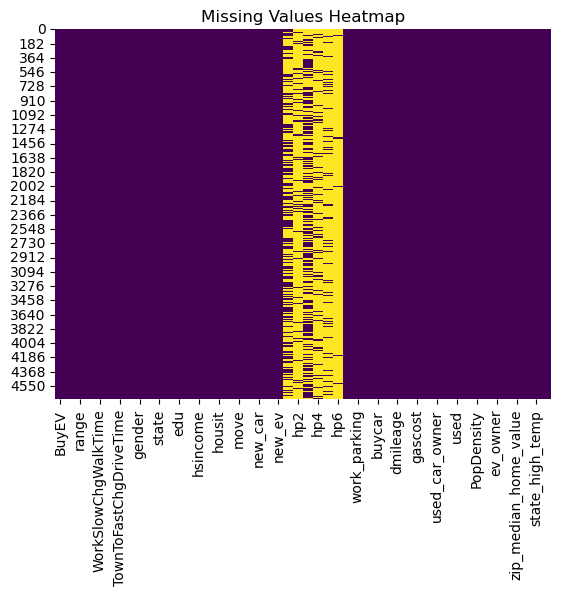

In [5]:
# Check for missing values
print(df_train.isnull().sum())

# Visualize missing values
sns.heatmap(df_train.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


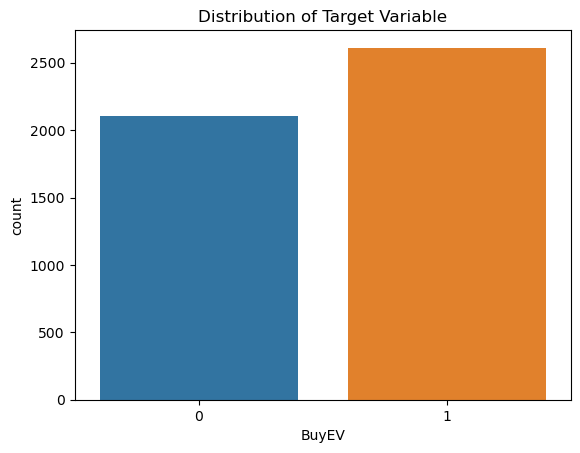

In [6]:
# Distribution of the target variable
sns.countplot(x='BuyEV', data=df_train)
plt.title('Distribution of Target Variable')
plt.show()


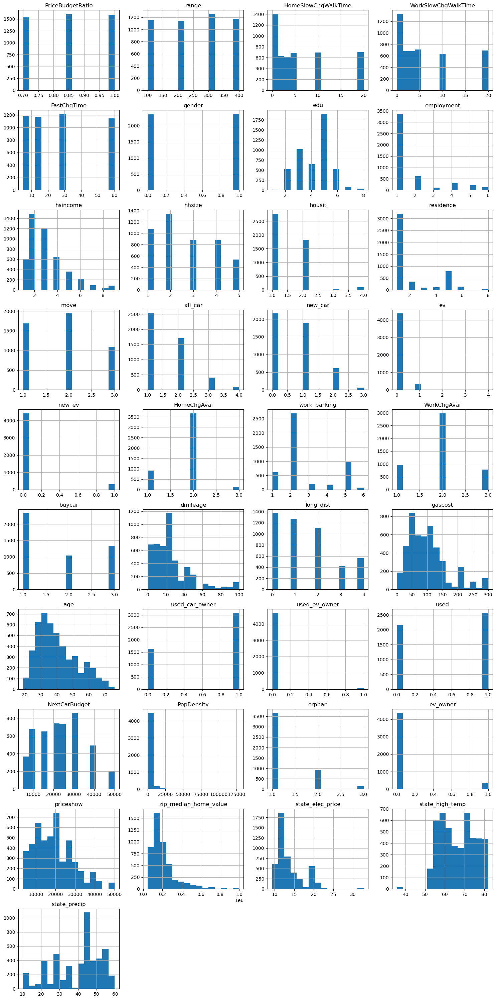

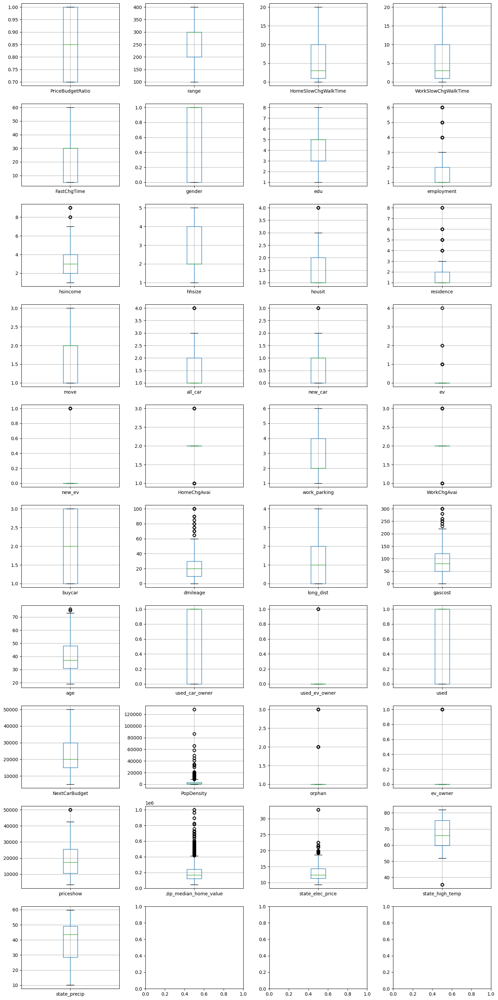

In [21]:
import math
import matplotlib.pyplot as plt

# Determine the number of rows and columns to fit all numerical features
num_features = len(numerical_cols)
cols = 4  # Set the number of columns you prefer
rows = math.ceil(num_features / cols)  # Calculate the number of rows needed

# Histograms for numerical features
df_train[numerical_cols].hist(bins=15, figsize=(15, rows * 3), layout=(rows, cols))
plt.tight_layout()  # Adjust subplots to fit into the figure area.
plt.show()

# Boxplots for numerical features
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15, rows * 3))
for i, col in enumerate(numerical_cols):
    row = i // cols
    col_idx = i % cols
    df_train.boxplot(column=[col], ax=axes[row, col_idx])
plt.tight_layout()
plt.show()


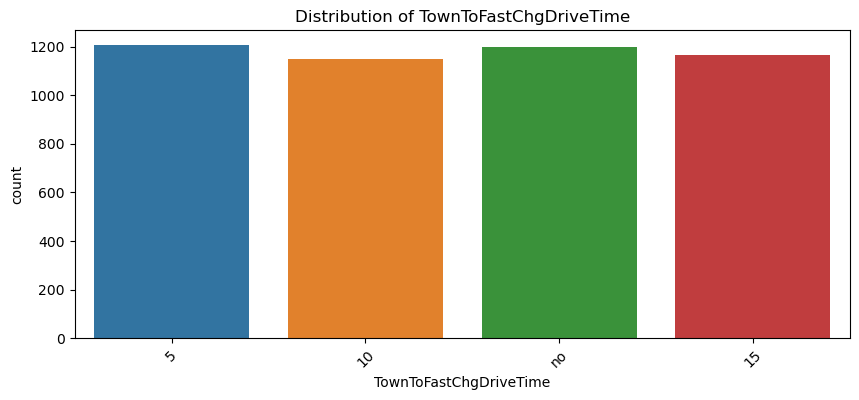

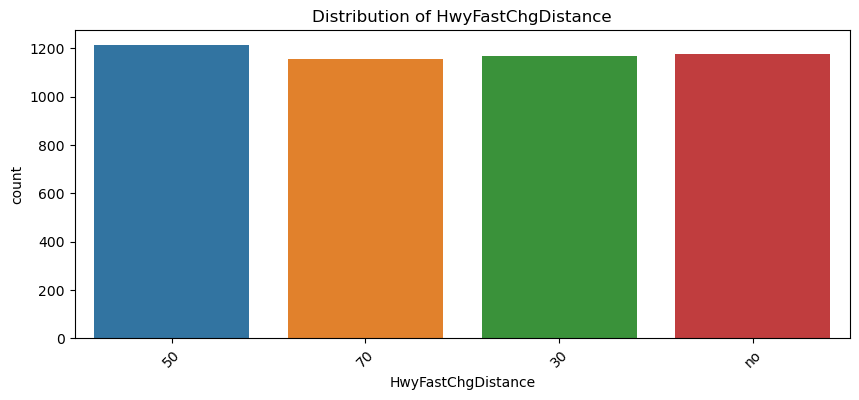

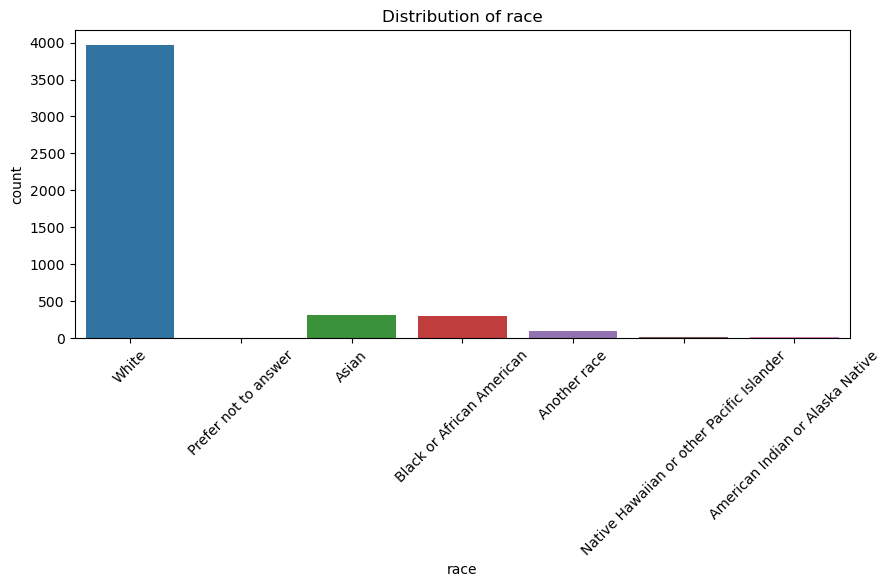

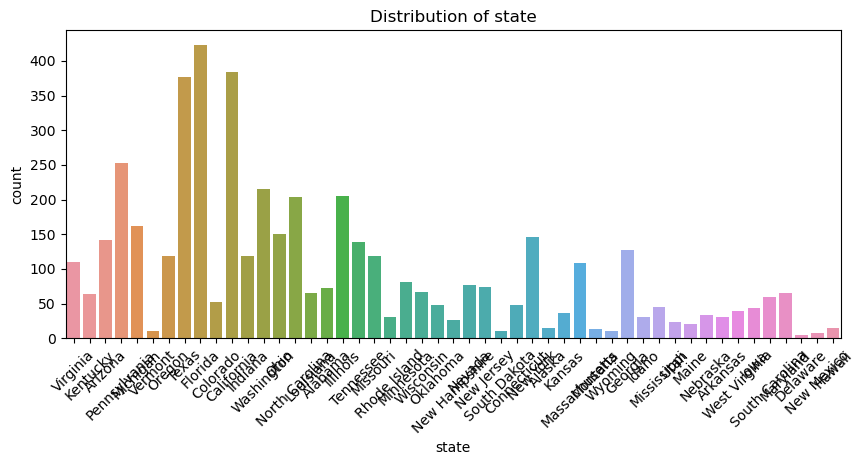

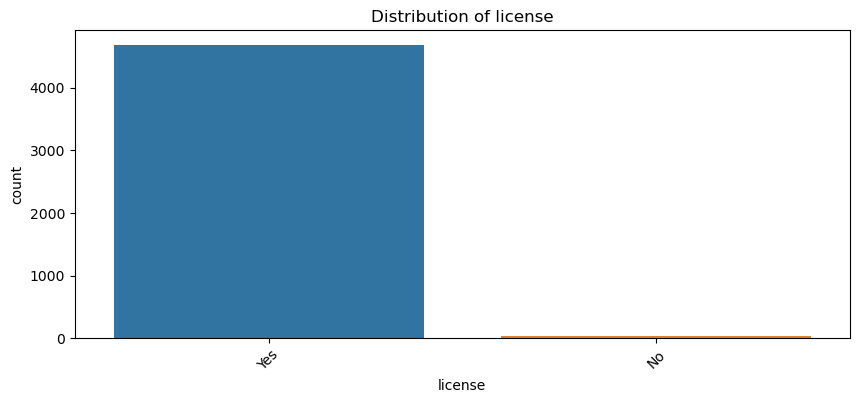

...

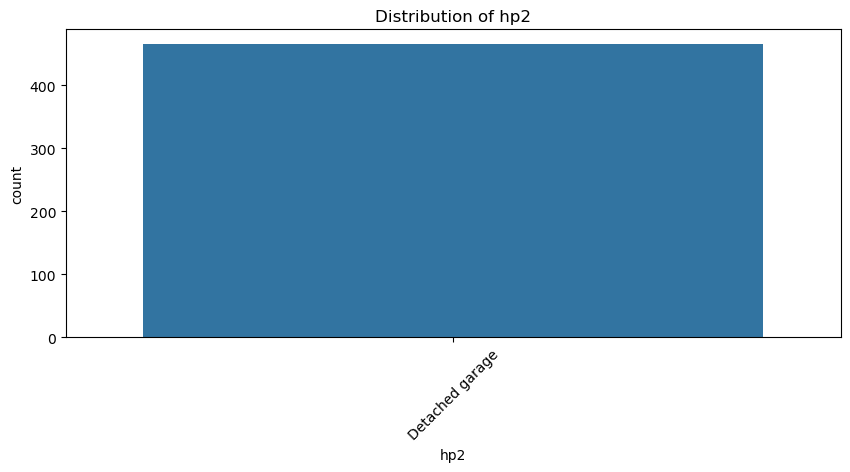

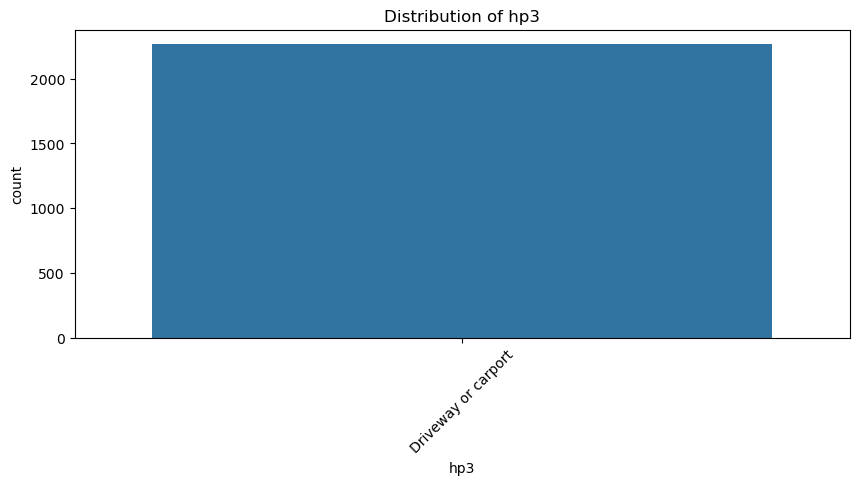

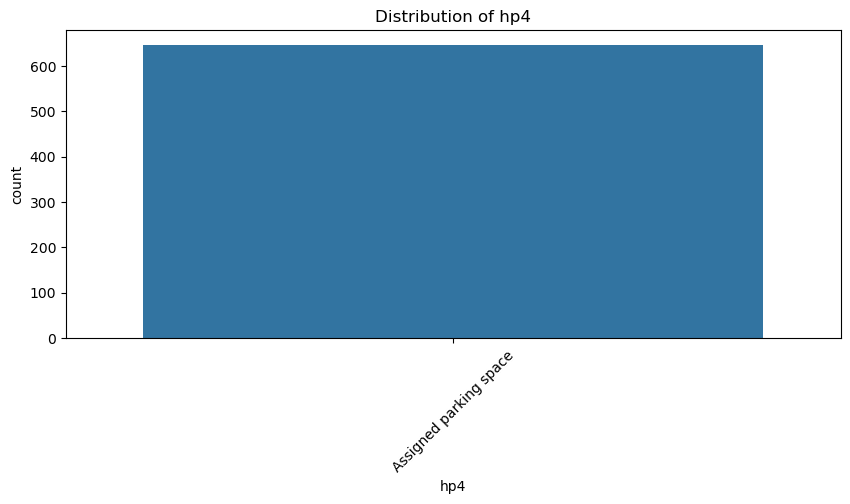

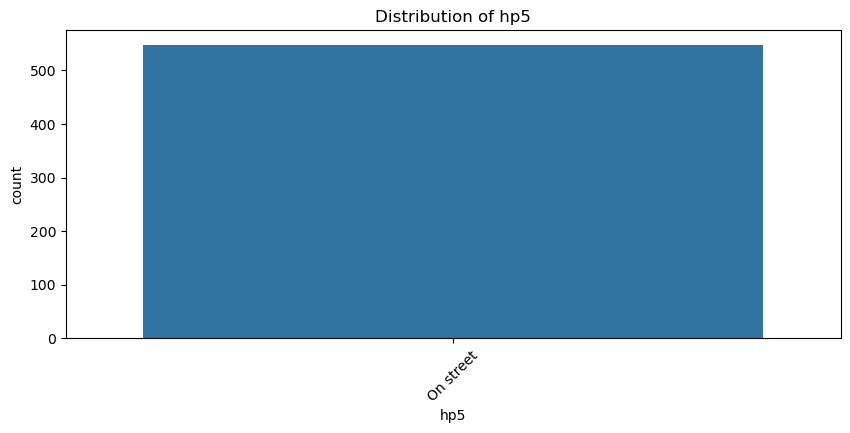

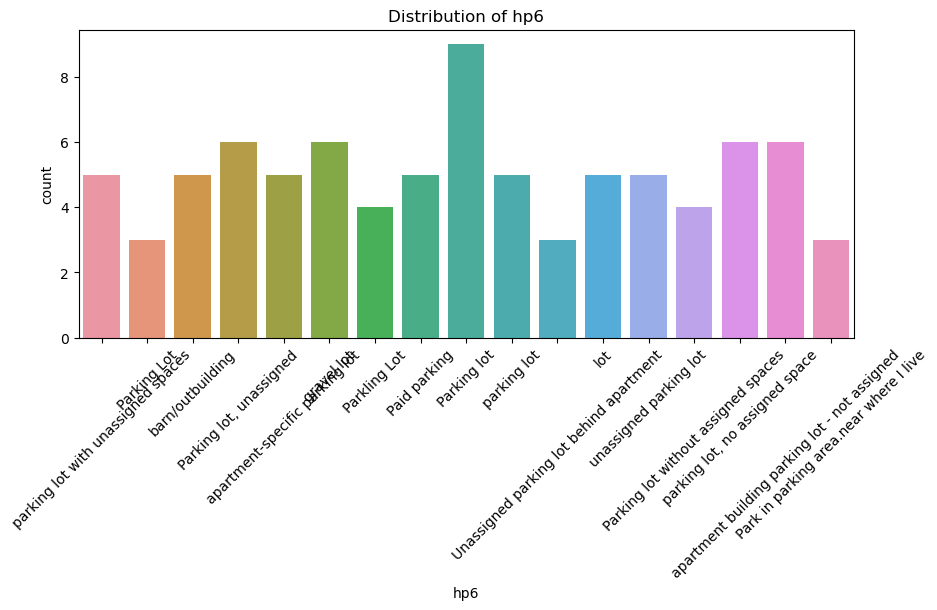

In [14]:
# Countplots for categorical features
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=col, data=df_train)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()


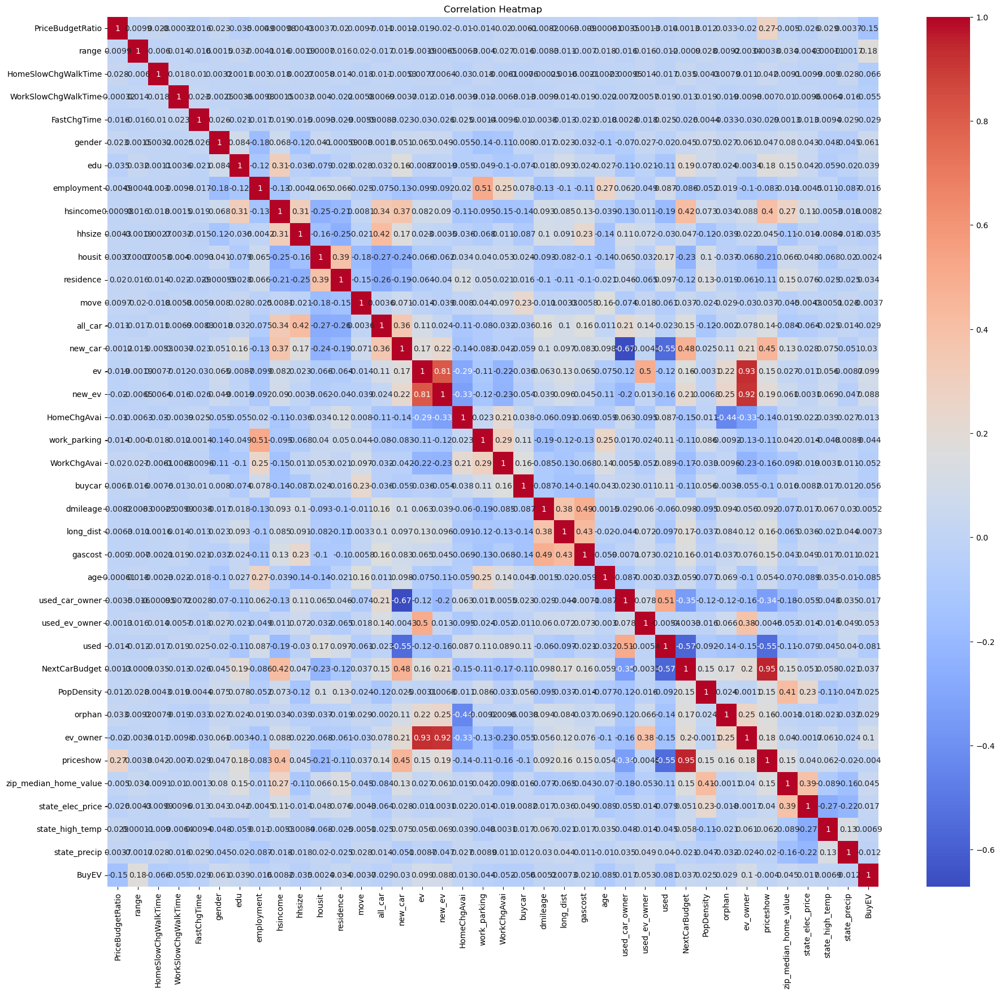

In [18]:
# Correlation heatmap
corr = df_train[numerical_cols + ['BuyEV']].corr()
plt.figure(figsize=(22,20))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [19]:
# Pairplot for a subset of features (optional: add hue='BuyEV' for classification)
sns.pairplot(df_train[numerical_cols + ['BuyEV']], hue='BuyEV')
plt.show()
